# DeepMReyeCalib


#### Eye movement data analysis:

- [x] Step 1. Extract time series
- [X] Step 2. Extract saccades for each trials

#### Step 1: extract time series

In [4]:
# Imports
import os
import numpy as np
import glob
import pandas as pd
from mat4py import loadmat
from sac_utils import vecvel, microsacc_merge, saccpar, isincircle
import ipdb

# figure imports
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.express as px
from plot_utils import plotly_template

In [5]:
# Define parameters
num_trials = 118                      # number of trials per run
#parameters for model (saccade detection)
sampling_rate = 1000                   # eyetrakcing sampling rate
velocity_th = 1.5                      # velocity sd threshold
min_dur = 20                           # threshold minimum duration
merge_interval = 20                    # interval between saccade events
cor_sac_onset_th = 100                 # corrective saccade onset threshold (inferior or equal in ms)
fix_trial_end_soa = 800                # duration between fixation offset and trial end for blink checking 
fix_area_rad = 2                       # saccade onset position tolerance area in dva
sac_area_rad = 3                       # saccade landing area tolerance in dva
sac_lat_min = 50                       # saccade latency minimum duration
sac_lat_max = 400                      # saccade latency maximum duration

In [6]:
# Define folders
# when on mac
base_dir = r'/Users/sinakling/projects/deepmreyecalib' 
data_dir = '{}\data'.format(base_dir)
subject = 'sub-02'

subject_num = subject[4:]
fig_dir = '{data_dir}\{subject}\figures'.format(data_dir=data_dir, subject=subject)

In [7]:
# when on windows 
# Define folders
base_dir = r'C:\Users\sinak\Documents\INT\Year_1\DeepMReye\new_experiment\deepmreyecalib' 
data_dir = '{}\data'.format(base_dir)
subject = 'sub-02'

subject_num = subject[4:]
fig_dir = '{data_dir}\{subject}\figures'.format(data_dir=data_dir, subject=subject)

In [4]:
# Define data filenames
data_events = sorted(glob.glob(r'{}\{}\ses-01\beh\*.tsv'.format(data_dir,subject)))
num_run = len(data_events)

data_eyetrack = sorted(glob.glob(r'{}\{}\ses-01\beh\*.edf'.format(data_dir,subject)))
data_mat = sorted(glob.glob(r'{}\{}\ses-01\beh\*.mat'.format(data_dir,subject)))

In [47]:
# Create message and data files
for run in data_eyetrack:
    
    if not os.path.exists(run.replace('.edf','.msg')):
        #os.system('edf2asc.exe {} -e -y'.format(run))    #!EXECUTE through cmd (start edf2asc "C:\Users\sinak\Documents\INT\Year_1\DeepMReye\new_experiment\deepmreyecalib\data\sub-02\ses-01\beh\sub-02_ses-01_task-DeepMReyeCalib_run-01_eyetrack.edf" -e -y)
        os.rename(run.replace('.edf','.asc'),run.replace('.edf','.msg'))

    if not os.path.exists(run.replace('.edf','.dat')): 
       # os.system('edf2asc.exe {} -s -miss -1.0 -y'.format(run)) #!EXECUTE through cmd  (start edf2asc "C:\Users\sinak\Documents\INT\Year_1\DeepMReye\new_experiment\deepmreyecalib\data\sub-02\ses-01\beh\sub-02_ses-01_task-DeepMReyeCalib_run-02_eyetrack.edf" -s -miss -1.0 -y)
       os.rename(run.replace('.edf','.asc'),run.replace('.edf','.dat'))

In [4]:
#when on mac
data_mat = sorted(glob.glob(r'{}\{}\ses-01\beh\*.mat'.format(data_dir,subject)))
data_events = [r'/Users/sinakling/projects/deepmreyecalib/data/sub-02/ses-01/beh/sub-02_ses-01_task-DeepMReyeCalib_run-01_events.tsv']
data_eyetrack = [r'/Users/sinakling/projects/deepmreyecalib/data/sub-02/ses-01/beh/sub-02_ses-01_task-DeepMReyeCalib_run-01_eyetrack.edf']

num_run = len(data_events)

In [8]:
#when on windows
data_mat = sorted(glob.glob(r'{}\{}\ses-01\beh\*.mat'.format(data_dir,subject)))
data_events = [r'C:\Users\sinak\Documents\INT\Year_1\DeepMReye\new_experiment\deepmreyecalib\data\sub-02\ses-01\beh\sub-02_ses-01_task-DeepMReyeCalib_run-01_events.tsv']
data_eyetrack = [r'C:\Users\sinak\Documents\INT\Year_1\DeepMReye\new_experiment\deepmreyecalib\data\sub-02\ses-01\beh\sub-02_ses-01_task-DeepMReyeCalib_run-01_eyetrack.edf']

num_run = len(data_events)

In [9]:
# Collect MSG data
#saves timestamps from messages send to eyetracking data in dataframe 
#attaches all runs after each other 

#adapted for DeepMReyeCalib 

msg_outputs = ['trial_onset', 'trial_offset', 'check_fix_onset', 'iti_onset', 'iti_offset', 
               'fixation_onset', 'fixation_offset', 'pursuit_onset', 'pursuit_offset', 'freeview_onset', 
               'freeview_offset']
 
for msg_output in msg_outputs:
    exec("{} = np.zeros(num_trials*num_run)".format(msg_output))

t_run = 0
for run in data_eyetrack:
    
    msgfid = open(run.replace('.edf','.msg'))
    first_last_time, first_time, last_time = False, False, False

    while not first_last_time:
        line_read = msgfid.readline()

        if not line_read == '':
            la = line_read.split()
    
            if len(la) > 2:
                if la[2] == 'RECORD_START' and not first_time:                      #Eyelink('message', 'RECORD_START'); 
                    first_time = True
                if la[2] == 'RECORD_STOP' and not last_time:                        #Eyelink('message', 'RECORD_STOP');
                    last_time = True
            if len(la) > 4:
                if la[2] == 'trial' and la[4]=='started':                           #Eyelink('message', '%s', sprintf('trial %i started\n', t));
                    trial_onset[int(la[3])-1 + (t_run)*num_trials] = float(la[1])   
                if la[2] == 'trial' and la[4]=='ended':                             #Eyelink('message', '%s', sprintf('trial %i ended\n', t));
                    trial_offset[int(la[3])-1 + (t_run)*num_trials] = float(la[1])
                if la[2] == 'iti' and la[4]=='onset':                               #Eyelink('message,'%s',log_txt); log_txt = sprintf('iti %i onset at %f', t, vbl);
                    iti_onset[int(la[3])-1 + (t_run)*num_trials] = float(la[1])
                if la[2] == 'iti' and la[4]=='offset':
                    iti_offset[int(la[3])-1 + (t_run)*num_trials] = float(la[1])
                if la[2] == 'fixation' and la[4]=='onset':                          #Eyelink('message,'%s',log_txt); log_txt = sprintf('fixation %i onset at %f', t, vbl);
                    fixation_onset[int(la[3])-1 + (t_run)*num_trials] = float(la[1])
                if la[2] == 'fixation' and la[4]=='offset':
                    fixation_offset[int(la[3])-1 + (t_run)*num_trials] = float(la[1])
                if la[2] == 'pursuit' and la[4]=='onset':
                    pursuit_onset[int(la[3])-1 + (t_run)*num_trials] = float(la[1]) #Eyelink('message,'%s',log_txt); log_txt = sprintf('pursuit %i onset at %f', t, vbl);
                if la[2] == 'pursuit' and la[4]=='offset':
                    pursuit_offset[int(la[3])-1 + (t_run)*num_trials] = float(la[1])
                if la[2] == 'freeview' and la[4]=='onset':
                    freeview_onset[int(la[3])-1 + (t_run)*num_trials] = float(la[1]) #Eyelink('message,'%s',log_txt); log_txt = sprintf('freeview %i onset at %f', t, vbl);
                if la[2] == 'freeview' and la[4]=='offset':
                    freeview_offset[int(la[3])-1 + (t_run)*num_trials,] = float(la[1])
    
        if first_time and last_time:
            first_last_time = True
            msgfid.close();
    t_run += 1

# create events dataframe
for run_num, run in enumerate(data_events):
    df_run = pd.read_csv(run, sep="\t")
    if run_num  > 0 :
        df_events = pd.concat([df_events, df_run])
    else :
        df_events = df_run
        

msg_dict = {}
for msg_output in msg_outputs:
    eval("msg_dict.update({'%s':%s})"%(msg_output,msg_output))
    
msg_dict.update({'iti_duration': iti_offset-iti_onset})
msg_dict.update({'fixation_duration': fixation_offset-fixation_onset})
msg_dict.update({'pursuit_duration': pursuit_offset-pursuit_onset})
msg_dict.update({'freeview_duration': freeview_offset-freeview_onset})

df_msg = pd.DataFrame(msg_dict)
df_all = pd.concat([df_events.reset_index(drop=True),
                    df_msg.reset_index(drop=True)], axis=1)

In [13]:
df_all

,onset,duration,run_number,trial_number,task,fixation_location,pursuit_amplitude,pursuit_angle,image_id,trial_onset,...,fixation_onset,fixation_offset,pursuit_onset,pursuit_offset,freeview_onset,freeview_offset,iti_duration,fixation_duration,pursuit_duration,freeview_duration
0,7928.766396,5.990946,1,1,1,13.0,NaN,NaN,NaN,7910009.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5993.0,0.0,0.0,0.0
1,7934.765674,1.191568,1,2,2,9.0,NaN,NaN,NaN,7916008.0,...,7916014.0,7917207.0,0.0,0.0,0.0,0.0,0.0,1193.0,0.0,0.0
2,7935.965576,1.191551,1,3,2,6.0,NaN,NaN,NaN,7917208.0,...,7917214.0,7918407.0,0.0,0.0,0.0,0.0,0.0,1193.0,0.0,0.0
3,7937.165462,1.191463,1,4,2,23.0,NaN,NaN,NaN,7918408.0,...,7918414.0,7919607.0,0.0,0.0,0.0,0.0,0.0,1193.0,0.0,0.0
4,7938.373763,1.191380,1,5,2,20.0,NaN,NaN,NaN,7919613.0,...,7919624.0,7920815.0,0.0,0.0,0.0,0.0,0.0,1191.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,8093.211644,3.591140,1,114,4,NaN,NaN,NaN,3.0,8074448.0,...,0.0,0.0,0.0,0.0,8074461.0,8078052.0,0.0,0.0,0.0,3591.0
114,8096.819452,3.591143,1,115,4,NaN,NaN,NaN,1.0,8078055.0,...,0.0,0.0,0.0,0.0,8078069.0,8081660.0,0.0,0.0,0.0,3591.0
115,8100.435611,3.591124,1,116,4,NaN,NaN,NaN,6.0,8081673.0,...,0.0,0.0,0.0,0.0,8081683.0,8085276.0,0.0,0.0,0.0,3593.0
116,8104.043404,3.591142,1,117,4,NaN,NaN,NaN,8.0,8085285.0,...,0.0,0.0,0.0,0.0,8085293.0,8088883.0,0.0,0.0,0.0,3590.0


In [62]:
df_all.to_csv("messages_sub01_calib.csv")   #sanity check

Step 2: Extract Gaze Positions 

-to plot: center each value (-middle of screen x and y respecitively), convert to degrees 

In [10]:
# Load eyetracking data 
# onsets and offsets per task 

# Initialize dictionaries to store positions for each task
positions_per_task = {task: [] for task in ['iti', 'fixation', 'pursuit', 'freeview']}

# Iterate over eyetracking data files
for run in data_eyetrack:
    for task in positions_per_task.keys():
        # Load eyetracking data
        eye_data_run = np.genfromtxt(run.replace('.edf', '.dat'), usecols=(0, 1, 2))

        # Extract x and y positions for onsets and offsets of each trial
        for _, trial_info in df_all.iterrows():
            task_onset_col = f"{task}_onset"
            task_offset_col = f"{task}_offset"
            trial_data_logic = np.logical_and(eye_data_run[:, 0] >= float(trial_info[task_onset_col]),
                                              eye_data_run[:, 0] <= float(trial_info[task_offset_col]))

            if np.any(trial_data_logic):
                onset_x = eye_data_run[trial_data_logic][0, 1]  # x position at onset
                onset_y = eye_data_run[trial_data_logic][0, 2]  # y position at onset
                offset_x = eye_data_run[trial_data_logic][-1, 1]  # x position at offset
                offset_y = eye_data_run[trial_data_logic][-1, 2]  # y position at offset

                # Append positions to the dictionary
                trial_positions = np.array([onset_x, onset_y, offset_x, offset_y])
                positions_per_task[task].append(trial_positions)
            else:
                # Append NaN if no data points are found
                positions_per_task[task].append(np.array([np.nan, np.nan, np.nan, np.nan]))
                print(f"No data points found for Run {trial_info['run_number']}, Trial {trial_info['trial_number']}")

# Convert the dictionary of positions to a dictionary of NumPy arrays
positions_per_task = {task: np.array(positions) for task, positions in positions_per_task.items()}

# Now you have separate arrays for each task
for task, positions in positions_per_task.items():
    print(f"All Positions for {task} task:")
    print(positions)



No data points found for Run 1.0, Trial 2.0
No data points found for Run 1.0, Trial 3.0
No data points found for Run 1.0, Trial 4.0
No data points found for Run 1.0, Trial 5.0
No data points found for Run 1.0, Trial 6.0
No data points found for Run 1.0, Trial 7.0
No data points found for Run 1.0, Trial 8.0
No data points found for Run 1.0, Trial 9.0
No data points found for Run 1.0, Trial 10.0
No data points found for Run 1.0, Trial 11.0
No data points found for Run 1.0, Trial 12.0
No data points found for Run 1.0, Trial 13.0
No data points found for Run 1.0, Trial 14.0
No data points found for Run 1.0, Trial 15.0
No data points found for Run 1.0, Trial 16.0
No data points found for Run 1.0, Trial 17.0
No data points found for Run 1.0, Trial 18.0
No data points found for Run 1.0, Trial 19.0
No data points found for Run 1.0, Trial 20.0
No data points found for Run 1.0, Trial 21.0
No data points found for Run 1.0, Trial 22.0
No data points found for Run 1.0, Trial 23.0
No data points fou

In [11]:
# Get all positions in workable format 
# Pursuit task 
all_iti = positions_per_task.get('iti')
x_iti = all_iti[:, [0, 2]]
flattened_x_iti = x_iti.flatten() 

print("Flattened x array for 'iti' task:")
print(flattened_x_iti[:5])

y_iti = all_iti[:, [1, 3]]
flattened_y_iti = y_iti.flatten() 

print("Flattened y array for 'iti' task:")
print(flattened_y_iti[:5])

# Fixation task 
all_fixation = positions_per_task.get('fixation')
x_fixation = all_fixation[:, [0, 2]]  #onset and offset x
flattened_x_fixation = x_fixation.flatten() 

print("Flattened x array for 'fixation' task:")
print(flattened_x_fixation[:5])


y_fixation = all_fixation[:, [1, 3]]  #onset and offset y
flattened_y_fixation = y_fixation.flatten() 
print("Flattened y array for 'fixation' task:")
print(flattened_y_fixation[:5])


# Pursuit task 
all_pursuit = positions_per_task.get('pursuit')
x_pursuit = all_pursuit[:, [0, 2]]
flattened_x_pursuit = x_pursuit.flatten() 

print("Flattened x array for 'pursuit' task:")
print(flattened_x_pursuit[:5])

y_pursuit = all_pursuit[:, [1, 3]]
flattened_y_pursuit = y_pursuit.flatten() 

print("Flattened y array for 'pursuit' task:")
print(flattened_y_pursuit[:5])


# Freeviewing task 
all_freeview = positions_per_task.get('freeview')
x_freeview = all_freeview[:, [0, 2]]
flattened_x_freeview = x_freeview.flatten() 

print("Flattened x array for 'freeview' task:")
print(flattened_x_freeview[:5])

y_freeview = all_freeview[:, [1, 3]]
flattened_y_freeview = y_freeview.flatten() 

print("Flattened y array for 'freeview' task:")
print(flattened_y_freeview[:5])

Flattened x array for 'iti' task:
[957.3 953.5   nan   nan   nan]
Flattened y array for 'iti' task:
[421.1 542.4   nan   nan   nan]
Flattened x array for 'fixation' task:
[   nan    nan  954.5 1136.2 1135.2]
Flattened y array for 'fixation' task:
[  nan   nan 542.9 345.6 344.2]
Flattened x array for 'pursuit' task:
[nan nan nan nan nan]
Flattened y array for 'pursuit' task:
[nan nan nan nan nan]
Flattened x array for 'freeview' task:
[nan nan nan nan nan]
Flattened y array for 'freeview' task:
[nan nan nan nan nan]


In [12]:
# Expected Position 
# extract fixation point position (from matlab encoding)
fixations_positions = [
    [-7.0, 7.0], [-3.5, 7.0], [0.0, 7.0], [3.5, 7.0], [7.0, 7.0],
    [-7.0, 3.5], [-3.5, 3.5], [0.0, 3.5], [3.5, 3.5], [7.0, 3.5],
    [-7.0, 0.0], [-3.5, 0.0], [0.0, 0.0], [3.5, 0.0], [7.0, 0.0],
    [-7.0, -3.5], [-3.5, -3.5], [0.0, -3.5], [3.5, -3.5], [7.0, -3.5],
    [-7.0, -7.0], [-3.5, -7.0], [0.0, -7.0], [3.5, -7.0], [7.0, -7.0]
]


expected_position_fix = []

for i in range(0,118): # only one run
    if not pd.isna(df_all['fixation_location'][i]):
        index = int(df_all['fixation_location'][i])-1

        
        expected_position_fix.append(fixations_positions[index])
    else: 
        expected_position_fix.append(np.nan)

expected_position_fix_x = [item[0] if isinstance(item, list) else item for item in expected_position_fix]
print(expected_position_fix_x)

expected_position_fix_y = [item[1] if isinstance(item, list) else item for item in expected_position_fix]
print(expected_position_fix_y)

expected_position_fix_x = np.repeat(expected_position_fix_x, 2)
expected_position_fix_y = np.repeat(expected_position_fix_y, 2)


# check expected fixation positions 
#fig = px.scatter(x=expected_position_fix_x[:50], y=expected_position_fix_y[:50], width=800, height=800, template= "simple_white")
#fig.update_xaxes(range=[-10,10])
#fig.update_yaxes(range=[-10,10])

#fig.show()

[0.0, 3.5, -7.0, 0.0, 7.0, -3.5, -7.0, -7.0, 0.0, 7.0, -7.0, 7.0, -7.0, -7.0, 3.5, 7.0, 3.5, 7.0, -7.0, -3.5, 7.0, 0.0, 3.5, 0.0, 0.0, -3.5, 3.5, 0.0, 0.0, -7.0, -7.0, -3.5, 0.0, -3.5, -3.5, 7.0, -3.5, 0.0, 3.5, -7.0, 3.5, 7.0, 7.0, 3.5, 7.0, 3.5, -3.5, -3.5, 3.5, -3.5, 0.0, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]
[0.0, 3.5, 3.5, -7.0, -3.5, 0.0, -7.0, 3.5, 0.0, -7.0, 7.0, 7.0, 7.0, -7.0, 0.0, 0.0, -7.0, 3.5, -3.5, -7.0, 0.0, -3.5, 0.0, 3.5, 7.0, 7.0, -3.5, -3.5, 3.5, 0.0, -3.5, -7.0, -7.0, -3.5, 3.5, -3.5, -3.5, 0.0, -3.5, 0.0, 7.0, 3.5, 7.0, 3.5, -7.0, -7.0, 0.0, 3.5, 7.0, 7.0, 7.0, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan

In [15]:
import math 

def deg2pix(deg):
    pix_by_mm_x = 1920/696
    pix_by_mm_y = 1080/291  

    cm = 2*120*math.tan(0.5*math.pi/180) * deg
    pix_X = cm * 10 * pix_by_mm_x
    pix_Y = cm * 10 * pix_by_mm_y
    
    return pix_X


In [16]:
# Constants
TR_sec = 1.2
pursuit_dur_TR = 1
frame_duration = 1/120
pursuit_dur_sec = pursuit_dur_TR * TR_sec
pursuit_dur_frm = 72
#pursuit_dur_sec / frame_duration
nb_trials_pursuit = 54

amplitude = 'pursuit_amplitude'
angle = 'pursuit_angle'

# Extracting the values from the DataFrame columns
pursuit_amp_values = df_all[amplitude].values
pursuit_angle_values = df_all[angle].values

# Legend mapping
legend_ang = {1: 0, 2: 20, 3: 40, 4: 60, 5: 80, 6: 100, 
          7: 120, 8: 140, 9: 160, 10: 180, 11: 200, 
          12: 220, 13: 240, 14: 260, 15: 280, 16: 300, 
          17: 320, 18: 340}

legend_amp = {1: 3, 2: 5, 3: 7}

# Applying the transformation
pursuit_angle_values_transf = [legend_ang[val] if not math.isnan(val) else float('nan') for val in pursuit_angle_values]
pursuit_amp_values_transf = [legend_amp[val] if not math.isnan(val) else float('nan') for val in pursuit_amp_values]

pursuit_amp_values_transf = list(map(deg2pix, pursuit_amp_values_transf))
print(pursuit_amp_values_transf)

# Initialize purs_x and purs_y arrays
purs_x = np.zeros(pursuit_dur_frm * nb_trials_pursuit)
purs_y = np.zeros(pursuit_dur_frm * nb_trials_pursuit)

pursuit_coord_on_list = []
pursuit_coord_off_list = []

pursuit_coord_off = np.zeros(2)

for index, row in df_all.iterrows():

    if index == 52:  # first one should be in center
        pursuit_coord_on = np.array([960, 540])
        pursuit_coord_off = pursuit_coord_on + np.array([
            pursuit_amp_values_transf[index] * np.cos(pursuit_angle_values_transf[index]),
            pursuit_amp_values_transf[index] * - np.sin(np.radians(pursuit_angle_values_transf[index]))
        ])
        print(pursuit_coord_off)
        
        
    elif index == 106:
        pursuit_coord_on = pursuit_coord_off
        pursuit_coord_off = np.array([960, 540])  # final one should be in center
        


    else:
        pursuit_coord_on = pursuit_coord_off
        pursuit_coord_off = pursuit_coord_on + np.array([
            pursuit_amp_values_transf[index] * np.cos(np.radians(pursuit_angle_values_transf[index])),
            pursuit_amp_values_transf[index] * - np.sin(np.radians(pursuit_angle_values_transf[index]))
        ])
    
    # Append to lists
    pursuit_coord_on_list.append(pursuit_coord_on)
    pursuit_coord_off_list.append(pursuit_coord_off)

# Convert lists to NumPy arrays
pursuit_coord_on_arr = np.array(pursuit_coord_on_list)
pursuit_coord_off_arr = np.array(pursuit_coord_off_list)





[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 173.33364991300218, 404.4451831303384, 288.8894165216703, 288.8894165216703, 404.4451831303384, 404.4451831303384, 173.33364991300218, 173.33364991300218, 404.4451831303384, 288.8894165216703, 173.33364991300218, 404.4451831303384, 288.8894165216703, 173.33364991300218, 404.4451831303384, 404.4451831303384, 288.8894165216703, 173.33364991300218, 288.8894165216703, 173.33364991300218, 173.33364991300218, 404.4451831303384, 288.8894165216703, 404.4451831303384, 404.4451831303384, 173.33364991300218, 288.8894165216703, 288.8894165216703, 173.33364991300218, 288.8894165216703, 173.33364991300218, 288.8894165216703, 173.33364991300218, 404.4451831303384, 173.33364991300218, 404.4451831303384, 288.8894165216703, 173.33364991300218, 404

In [17]:
on_x = [row[0] for row in pursuit_coord_on_arr]
off_x = [row[0] for row in pursuit_coord_off_arr]

on_y = [row[1] for row in pursuit_coord_on_arr]
off_y = [row[1] for row in pursuit_coord_off_arr]

purs_x = list(zip(on_x, off_x))
purs_y = list(zip(on_y, off_y))


purs_x_flattened = np.array(purs_x).flatten() 
purs_y_flattened = np.array(purs_y).flatten()

In [19]:
def center(i, type = None, center_x = None, center_y = None):
    if  type == 'x':
        return i - center_x
    elif type == 'y': 
        return i - center_y
    else: 
        print("provide x or y") 

center_applied = np.vectorize(center)

def pix2deg_x(pix):
    pixSize =  696/1920  # mm/pix
    sz = pix * pixSize  # mm 
    ang = sz/(2*1200*math.tan(0.5*math.pi/180))
    #2 *  math.atan(sz / 2 * 1200)
    
    return ang

pix2deg_x_applied = np.vectorize(pix2deg_x)

def pix2deg_y(pix):
    pixSize =  391/1080  # mm/pix
    sz = pix * pixSize  # mm 
    ang = -1*(sz/(2*1200*math.tan(0.5*math.pi/180)))
    #2 *  math.atan(sz / 2 * 1200)
    
    return ang

pix2deg_y_applied = np.vectorize(pix2deg_y)

In [20]:
# Center eyetracking to screen and convert to degrees of visual angle

# Iti 
x_centered_iti = center_applied(flattened_x_iti,type = 'x', center_x = 960)
x_dva_iti = pix2deg_x_applied(x_centered_iti)

y_centered_iti = center_applied(flattened_y_iti,type = 'y', center_y = 540)
y_dva_iti = pix2deg_y_applied(y_centered_iti)

# Fixation 
x_centered_fix = center_applied(flattened_x_fixation,type = 'x', center_x = 960)
x_dva_fix = pix2deg_x_applied(x_centered_fix)

y_centered_fix = center_applied(flattened_y_fixation,type = 'y', center_y = 540)
y_dva_fix = pix2deg_y_applied(y_centered_fix)

# Pursuit 
x_centered_pur = center_applied(flattened_x_pursuit,type = 'x', center_x = 960)
x_dva_pur = pix2deg_x_applied(x_centered_pur)

y_centered_pur = center_applied(flattened_y_pursuit,type = 'y', center_y = 540)
y_dva_pur = pix2deg_y_applied(y_centered_pur)

# Freeviewing
x_centered_fv = center_applied(flattened_x_freeview,type = 'x', center_x = 960)
x_dva_fv = pix2deg_x_applied(x_centered_fv)

y_centered_fv = center_applied(flattened_y_freeview,type = 'y', center_y = 540)
y_dva_fv = pix2deg_y_applied(y_centered_fv)


In [21]:
# Expected pursuit 
x_centered_purs_exp = center_applied(purs_x_flattened,type = 'x', center_x = 960)
x_dva_purs_exp = pix2deg_x_applied(x_centered_purs_exp)

y_centered_purs_exp = center_applied(purs_y_flattened,type = 'y', center_y = 540)
y_dva_purs_exp = pix2deg_y_applied(y_centered_purs_exp)

In [130]:
fig = go.Figure()


# plot data time series
fig.add_trace(go.Scatter(y=x_dva_iti[:238],
                         name='eyetracker position iti', 
                         mode='lines', 
                         marker=dict(color='black')))

fig.add_trace(go.Scatter(y=x_dva_fix[1:238],
                         name='eyetracker position fixiation', 
                         mode='lines', 
                         marker=dict(color='blue')))

fig.add_trace(go.Scatter(y=x_dva_pur[:238],
                         name='eyetracker position pursuit', 
                         mode='lines', 
                         marker=dict(color='grey')))

fig.add_trace(go.Scatter(y=x_dva_fv[:238],
                         name='eyetracker position freeviewing', 
                         mode='lines', 
                         marker=dict(color='red')))


# plot grid prediction
fig.add_trace(go.Scatter(y=expected_position_fix_x,
                         name='expected position fix'))


fig.add_trace(go.Scatter(y = x_dva_purs_exp,
                        name = 'expected position purs'))



fig.update_layout(template='simple_white',
                  xaxis_title = 'time (sec)',
                  yaxis_title = 'gaze position x onset and offset')

fig.update_xaxes(showticklabels = False)
fig.update_yaxes(range=[-10,10])

fig.show()

In [129]:
fig = go.Figure()


# plot data time series
fig.add_trace(go.Scatter(y=y_dva_iti[:238],
                         name='eyetracker position iti', 
                         mode='lines', 
                         marker=dict(color='black')))

fig.add_trace(go.Scatter(y=y_dva_fix[1:238],
                         name='eyetracker position fixiation', 
                         mode='lines', 
                         marker=dict(color='blue')))

fig.add_trace(go.Scatter(y=y_dva_pur[:238],
                         name='eyetracker position pursuit', 
                         mode='lines', 
                         marker=dict(color='grey')))

fig.add_trace(go.Scatter(y=y_dva_fv[:238],
                         name='eyetracker position freeviewing', 
                         mode='lines', 
                         marker=dict(color='red')))

# plot grid prediction
fig.add_trace(go.Scatter(y=expected_position_fix_y,
                         name='expected position fix'))

fig.add_trace(go.Scatter(y= y_dva_purs_exp,
                         name = 'expected position purs'))


fig.update_layout(template='simple_white',
                  xaxis_title = 'time (sec)',
                  yaxis_title = 'gaze position y onset and offset')

fig.update_xaxes(showticklabels = False)
fig.update_yaxes(range=[-10,10])

fig.show()

In [54]:
import plotly.graph_objects as go

# Sample data
actual_data = x_dva_fix[1:238]
expected_curve = expected_position_fix_x

# Create a trace for the actual data
trace_actual = go.Scatter(
    x=list(range(1, len(actual_data)+1)),
    y=actual_data,
    mode='lines',
    name='Eyetracker Gaze Position',
    line=dict(color='black', width=2.5),
)

# Create a trace for the expected curve
trace_expected = go.Scatter(
    x=list(range(1, len(expected_curve)+1)),
    y=expected_curve,
    mode='lines',
    name='Expected Gaze Position',
    line=dict(color='lightskyblue', width=2, dash='dashdot'),
)

# Create layout with specific style for a nature paper
layout = go.Layout(
    title='Fixation task',
    title_x = 0.5,
    xaxis=dict(title='Time (trials)', range = [0,55]),
    yaxis=dict(title='X Gaze Position', range = [-10,10]),
    showlegend=True,
    legend=dict(x=0.05, y=1),
    font=dict(family='Arial', size=12, color='black'),
    paper_bgcolor='white',  # Background color
    plot_bgcolor='white',   # Plot area background color
    margin=dict(l=50, r=50, t=50, b=50),  # Margins
)

# Create figure
fig = go.Figure(data=[trace_actual, trace_expected], layout=layout)

# Show the plot
fig.show()


In [57]:
import plotly.graph_objects as go

# Sample data
actual_data = x_dva_pur[:238]
expected_curve = x_dva_purs_exp

# Create a trace for the actual data
trace_actual = go.Scatter(
    x=list(range(1, len(actual_data)+1)),
    y=actual_data,
    mode='lines',
    name='Eyetracker Gaze Position',
    line=dict(color='black', width=2.5),
)

# Create a trace for the expected curve
trace_expected = go.Scatter(
    x=list(range(1, len(expected_curve)+1)),
    y=expected_curve,
    mode='lines',
    name='Expected Gaze Position',
    line=dict(color='lightskyblue', width=2, dash='dashdot'),
)

# Create layout with specific style for a nature paper
layout = go.Layout(
    title='Pursuit task',
    title_x = 0.5,
    xaxis=dict(title='Time (trials)', range = [100,200]),
    yaxis=dict(title='X Gaze Position', range = [-10,10]),
    showlegend=True,
    legend=dict(x=0.05, y=1),
    font=dict(family='Arial', size=12, color='black'),
    paper_bgcolor='white',  # Background color
    plot_bgcolor='white',   # Plot area background color
    margin=dict(l=50, r=50, t=50, b=50),  # Margins
)

# Create figure
fig = go.Figure(data=[trace_actual, trace_expected], layout=layout)

# Show the plot
fig.show()


In [215]:
def euclidian_distance(point_1, point_2):
    array_1, array_2 = np.array(point_1), np.array(point_2)
    squared_distance = np.sum(np.square(array_1 - array_2))
    distance = np.sqrt(squared_distance)
    return distance

distances_x_fixation = []

for i in range(236):
    distances_x_fixation.append(euclidian_distance(x_dva_fix[i], expected_position_fix_x[i]))


In [218]:
# plot grid prediction

fig2 = go.Figure()
fig2.add_trace(go.Scatter(y=np.array(distances_x_fixation),
                         name='expected position'))


fig2.update_layout(template='simple_white',
                  xaxis_title = 'time (sec)',
                  yaxis_title = 'eucledian distance')

fig2.update_xaxes(showticklabels = False)

fig2.show()

In [97]:
import plotly.express as px

#Gaze X Position Eyetracker 

fig = px.line(eye_data_run, x=eye_data_run[:,0], y=gaze_x_degrees, title='Gaze Postion X Eyetracker',template= 'simple_white')
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(range=[-10,10])
fig.update_layout(xaxis_title="Time (s)", yaxis_title="Gaze Position X")
fig.show()

In [98]:
# Gaze Y Positio Eyetracker 

fig = px.line(eye_data_run, x=eye_data_run[:,0], y=gaze_y_degrees, title='Gaze Postion Y Eyetracker',template= 'simple_white')
fig.update_xaxes(showticklabels = False)
fig.update_yaxes(range= [-10,10])
fig.update_layout(xaxis_title="Time (s)", yaxis_title="Gaze Position Y")
fig.show()

Step 3: Extra Plots 

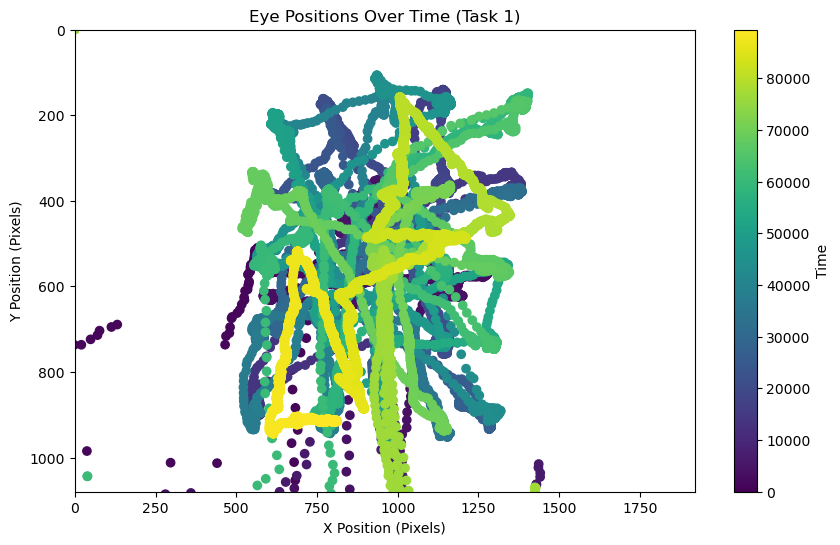

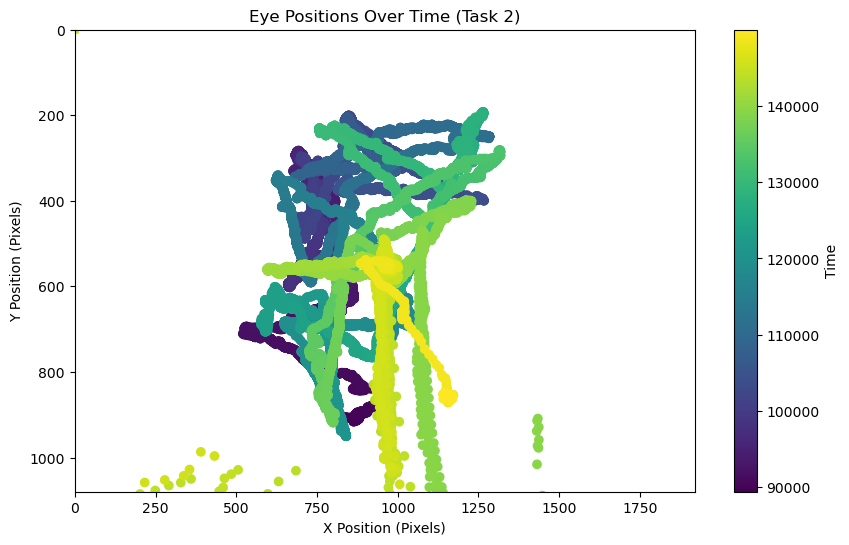

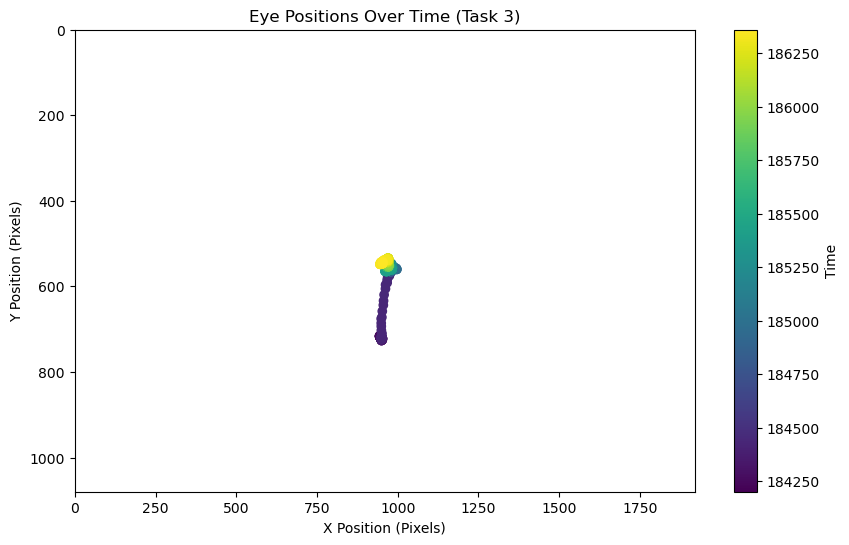

In [94]:
import matplotlib.pyplot as plt
import numpy as np


# Define the time ranges for each plot
time_ranges = [(0, 89400), (89401, 150000), (150001, len(eye_data_run[:,0]))]

# Screen resolution
screen_width = 1920
screen_height = 1080

# Create three separate plots
for i, (start, end) in enumerate(time_ranges, 1):
    plt.figure(figsize=(10, 6))
    
    # Filter data based on time range
    filtered_x = eye_data_run[:,1][start:end]
    filtered_y = eye_data_run[:,2][start:end]
    
    # Convert time values to integers for color representation
    colors = np.arange(start, end)
    
    # Plotting eye positions on the screen for the current time range
    scatter = plt.scatter(filtered_x, filtered_y, c=colors, cmap='viridis', marker='o', label='Eye Positions')

    # Adding labels and title
    plt.xlabel('X Position (Pixels)')
    plt.ylabel('Y Position (Pixels)')
    plt.title(f'Eye Positions Over Time (Task {i})')

    # Setting axis limits to match the screen resolution
    plt.xlim(0, screen_width)
    plt.ylim(screen_height, 0)  # Invert the y-axis

    # Adding colorbar to represent time
    cbar = plt.colorbar(scatter, label='Time')


    # Display the plot
    plt.show()


In [44]:
sac_outputs = [  'miss_time_trial', 'blink_trial', 'no_saccade_trial' ]
 
for sac_output in sac_outputs:
    exec("{} = np.zeros(num_trials*num_run)".format(sac_output))

print('Saccade extraction:')
t_run = 0
first_fig = 0
for run,mat in zip(data_eyetrack,data_mat):
    
    print(run)
    # load const
    mat_dat = loadmat(mat)

    #const.fixation_coord_x
    #const.fixation_coord_y
    #const.pursuit_amp
    #const.pursuit_angles
    #const.free_view_pic


    scr_x_mid = np.array(mat_dat['config']['scr']['x_mid'])
    scr_y_mid = np.array(mat_dat['config']['scr']['y_mid'])

    ppd = mat_dat['config']['const']['ppd'] # 1 pixel per dva
    
   # fix_area_rad_pix = ppd*fix_area_rad
   # sac_area_rad_pix = ppd*sac_area_rad
    
    # load eyetrack data
    eye_data_run = np.genfromtxt(run.replace('.edf','.dat'), usecols=(0, 1, 2))

    for trial in np.arange(0,num_trials):
        
        # define trial
        miss_time, blink, no_saccade, main_saccade, corrective_saccade, num_sac = 0, 0, 0, 0, 0, 0
        trial_idx = trial + (t_run)*num_trials
        df_t = df_all.loc[(df_all.run_number == t_run+1) & (df_all.trial_number == trial+1)]
        trial_data_logic = np.logical_and(eye_data_run[:,0] >= float(df_t.trial_onset),
                                          eye_data_run[:,0] <= float(df_t.trial_offset))
        blink_data_logic = np.logical_and(eye_data_run[:,0] >= float(df_t.trial_onset),
                                          eye_data_run[:,0] <= float(df_t.fix_offset)+fix_trial_end_soa)

        # Missing data point detection
        if np.sum(np.diff(eye_data_run[trial_data_logic,0])>1000/sampling_rate) > 0:
            miss_time = 1
            miss_time_trial[trial_idx] = 1
                     
        # Blink detection
        if not miss_time:
            if np.sum(eye_data_run[blink_data_logic,1]== -1):
                blink = 1
                blink_trial[trial_idx] = 1

        # Main and corrective saccade detection
        #if not miss_time and not blink:
        t, x, y = eye_data_run[trial_data_logic,0],eye_data_run[trial_data_logic,1],eye_data_run[trial_data_logic,2]
       # vx, vy = vecvel(x,y,sampling_rate)
       # sac = microsacc_merge(x,y,vx,vy,velocity_th,min_dur,merge_interval)
       # ms = saccpar(sac)
            
        if np.isnan(ms[0,0]):
            #4 no saccade
            no_saccade = 1
            no_saccade_trial[trial_idx] = 1

            
        if not no_saccade:
            innacurate_sac = 1
                
                # Define fixation and saccade target position
                # x_jitter = int(df_t.spatial_jitter_x)-1
                # y_jitter = int(df_t.spatial_jitter_y)-1
                # trial_sequence = int(df_t.trial_sequence)-1
                # saccade_direction = int(df_t.saccade_direction)-1
                # jitter_coord = np.array([motion_jitter[x_jitter],-motion_jitter[y_jitter]])  
                # fix_coord = fix_coord_ini + jitter_coord
                # fix_pos_x, fix_pos_y = fix_coord[0], fix_coord[1]
                # if trial_sequence <= 4:
                #     last_stroke_coord = np.array(mot_coord[saccade_direction,trial_sequence]) + jitter_coord;
                # else:
                #     last_stroke_coord = np.array(mot_coord[saccade_direction,2]) + jitter_coord;
                # sac_pos_x, sac_pos_y = last_stroke_coord[0], last_stroke_coord[1]
                
                # while num_sac < ms.shape[0]:
                    
                #     # Main saccade detection
                #     fix_cor = isincircle(x[int(ms[num_sac,0])],y[int(ms[num_sac,0])],fix_pos_x,fix_pos_y,fix_area_rad_pix)
                #     sac_cor = isincircle(x[int(ms[num_sac,1])],y[int(ms[num_sac,1])],sac_pos_x,sac_pos_y,sac_area_rad_pix)

                #     if np.logical_and(fix_cor,sac_cor):
                #         main_saccade = 1
                #         innacurate_sac = 0
                        
                #         sac_x_onset_trial[trial_idx] = (x[int(ms[num_sac,0])]-scr_x_mid)/ppd
                #         sac_x_offset_trial[trial_idx] = (x[int(ms[num_sac,1])]-scr_x_mid)/ppd
                #         sac_y_onset_trial[trial_idx] = -1*(y[int(ms[num_sac,0])]-scr_y_mid)/ppd
                #         sac_y_offset_trial[trial_idx] = -1*(y[int(ms[num_sac,1])]-scr_y_mid)/ppd
                #         sac_t_onset_trial[trial_idx] = t[int(ms[num_sac,0])]
                #         sac_t_offset_trial[trial_idx] = t[int(ms[num_sac,1])]
                #         sac_dur_trial[trial_idx] = ms[num_sac,2]
                #         sac_lat_trial[trial_idx] = t[int(ms[num_sac,0])] - float(df_t.fix_offset)
                #         sac_vpeak_trial[trial_idx] = ms[num_sac,3]/ppd
                #         sac_dist_trial[trial_idx] = ms[num_sac,4]/ppd
                #         sac_amp_trial[trial_idx] = ms[num_sac,6]/ppd
                #         sac_dist_ang_trial[trial_idx] = ms[num_sac,5]
                #         sac_amp_ang_trial[trial_idx] = ms[num_sac,7]
                #         jitter_x_trial[trial_idx] = (jitter_coord[0])/ppd       
                #         jitter_y_trial[trial_idx] = -1*(jitter_coord[1])/ppd
                        
                #         if sac_lat_trial[trial_idx] < sac_lat_min:
                #             early_sac_trial[trial_idx] = 1
                #             main_saccade = 0
                            
                #         if sac_lat_trial[trial_idx] > sac_lat_max:
                #             late_sac_trial[trial_idx] = 1
                #             main_saccade = 0
                            
                #     # Corrective saccade detection
                #     if main_saccade and corrective_saccade == 0:
                #         if t[int(ms[num_sac,0])] <= t[int(ms[num_sac-1,0])] + cor_sac_onset_th:
                #             corrective_saccade = 1
                            
                    #         cor_sac_x_onset_trial[trial_idx] = (x[int(ms[num_sac,0])]-scr_x_mid)/ppd
                    #         cor_sac_x_offset_trial[trial_idx] = (x[int(ms[num_sac,1])]-scr_x_mid)/ppd
                    #         cor_sac_y_onset_trial[trial_idx] = -1*(y[int(ms[num_sac,0])]-scr_y_mid)/ppd
                    #         cor_sac_y_offset_trial[trial_idx] = -1*(y[int(ms[num_sac,1])]-scr_y_mid)/ppd
                    #         cor_sac_t_onset_trial[trial_idx] = t[int(ms[num_sac,0])]
                    #         cor_sac_t_offset_trial[trial_idx] = t[int(ms[num_sac,1])]
                    #         cor_sac_dur_trial[trial_idx] = ms[num_sac,2]
                    #         cor_sac_vpeak_trial[trial_idx] = ms[num_sac,3]/ppd
                    #         cor_sac_dist_trial[trial_idx] = ms[num_sac,4]/ppd
                    #         cor_sac_amp_trial[trial_idx] = ms[num_sac,6]/ppd
                    #         cor_sac_dist_ang_trial[trial_idx] = ms[num_sac,5]
                    #         cor_sac_amp_ang_trial[trial_idx] = ms[num_sac,7]
                    
                    # num_sac += 1 
                    
                    # main_sac_trial[trial_idx] = main_saccade
                    # cor_sac_trial[trial_idx] = corrective_saccade
                    # innacurate_sac_trial[trial_idx] = innacurate_sac    

    t_run +=1
print('Done')

saccade_dict = {}
for sac_output in sac_outputs:
    eval("saccade_dict.update({'%s':%s})"%(sac_output,sac_output))

df_saccade = pd.DataFrame(saccade_dict)
df_all = pd.concat([df_all.reset_index(drop=True),
                    df_saccade.reset_index(drop=True)], axis=1)

for run in data_eyetrack:
    os.remove(run.replace('.edf','.msg'))
    os.remove(run.replace('.edf','.dat'))

Saccade extraction:
/Users/martinszinte/Dropbox/Data/Martin/Experiments/am3strokes/data/sub-07/add/sub-07_task-AM3strokes_run-01_eyetrack.edf
/Users/martinszinte/Dropbox/Data/Martin/Experiments/am3strokes/data/sub-07/add/sub-07_task-AM3strokes_run-02_eyetrack.edf
Done


In [45]:
# Save dataframe
df_all.to_csv('{data_dir}/{subject}/add/{subject}_task-AM3strokes_data.csv'.format(data_dir=data_dir,subject=subject))
